In [2]:
%load_ext watermark
%watermark

%load_ext autoreload
%autoreload 2

# import standard libs
from pathlib import Path


def get_relative_project_dir(project_repo_name=None, partial=True):
    """helper fn to get local project directory"""
    current_working_directory = Path.cwd()
    cwd_parts = current_working_directory.parts
    if partial:
        while project_repo_name not in cwd_parts[-1]:
            current_working_directory = current_working_directory.parent
            cwd_parts = current_working_directory.parts
    else:
        while cwd_parts[-1] != project_repo_name:
            current_working_directory = current_working_directory.parent
            cwd_parts = current_working_directory.parts
    return current_working_directory


import warnings

warnings.filterwarnings("ignore")
from IPython.display import display
from IPython.core.debugger import set_trace as bp
import itertools
from collections import namedtuple

# import python scientific stack
import pandas as pd

pd.set_option("display.max_rows", 200)
pd.set_option("display.max_columns", 200)
import numpy as np
import scipy.stats as stats
import statsmodels.api as sm

# import pymc3 as pm
import numba as nb
import yfinance as yf
import empyrical as em
#import ffn

# import visual tools
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import mplfinance as mpf

%matplotlib inline
import seaborn as sns

# import util libs
from tqdm import tqdm, tqdm_notebook

REPO_NAME = "hypothesis_driven_strategy_development"
print("\n", REPO_NAME)
pdir = get_relative_project_dir(REPO_NAME)
data_dir = pdir / "data"
external = data_dir / "external"
processed = data_dir / "processed"
viz = pdir / "visual"


def cprint(df: pd.DataFrame, nrows: int = None):
    """
    Custom dataframe print function
    """
    if not isinstance(df, (pd.DataFrame,)):
        try:
            df = df.to_frame()
        except:
            raise ValueError("object cannot be coerced to df")

    if not nrows:
        nrows = 5
    print("-" * 79)
    print("dataframe information")
    print("-" * 79)
    print(f"HEAD num rows: {nrows}")
    print(df.head(nrows))
    print("-" * 25)
    print(f"TAIL num rows: {nrows}")
    print(df.tail(nrows))
    print("-" * 50)
    print(df.info())
    print("-" * 79)
    print()


print()
%watermark

The watermark extension is already loaded. To reload it, use:
  %reload_ext watermark
2020-12-06T16:42:57-03:00

CPython 3.8.6
IPython 7.19.0

compiler   : MSC v.1916 64 bit (AMD64)
system     : Windows
release    : 10
machine    : AMD64
processor  : Intel64 Family 6 Model 158 Stepping 10, GenuineIntel
CPU cores  : 12
interpreter: 64bit
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload

 hypothesis_driven_strategy_development

2020-12-06T16:42:57-03:00

CPython 3.8.6
IPython 7.19.0

compiler   : MSC v.1916 64 bit (AMD64)
system     : Windows
release    : 10
machine    : AMD64
processor  : Intel64 Family 6 Model 158 Stepping 10, GenuineIntel
CPU cores  : 12
interpreter: 64bit


In [3]:
%load_ext nb_black


sns_params = {
    "xtick.major.size": 2,
    "ytick.major.size": 2,
    "font.size": 12,
    "font.weight": "medium",
    "figure.figsize": (10, 7),
    # "font.family": "Ubuntu Mono",
}
sns.set_theme(
    context="paper",
    style="white",
    palette=sns.color_palette("magma"),
    rc=sns_params,
)
savefig_kwds = dict(dpi=90, bbox_inches="tight", frameon=True, format="png")

<IPython.core.display.Javascript object>

# Get Data Files

In [4]:
symbols = [
    "AAL",
    "AAPL",
    "AMD",
    "AMZN",
    "ARKK",
    "BYND",
    "CCL",
    "DAL",
    "DDOG",
    "FDX",
    "FSLY",
    "GOOGL",
    "IBB",
    "IYR",
    "LUV",
    "MSFT",
    "NFLX",
    "NIO",
    "NKE",
    "NVDA",
    "PYPL",
    "RKT",
    "ROKU",
    "SHOP",
    "SMH",
    "SPG",
    "TDOC",
    "UPS",
    "VOX",
    "VTI",
    "WMT",
    "XLB",
    "XLE",
    "XLI",
    "XLK",
    "XLP",
    "XLU",
    "XLV",
    "XLY",
    "XOM",
]

<IPython.core.display.Javascript object>

In [5]:
for symbol in tqdm(symbols):
    tmp_df = yf.Ticker(symbol).history(period="max")
    outfile = external / f"{symbol}_daily_data.parq"
    tmp_df.to_parquet(outfile)

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:31<00:00,  1.29it/s]


<IPython.core.display.Javascript object>

### View example data

In [6]:
files = list(Path(external).rglob("*daily*.parq"))
files

[WindowsPath('D:/PERSONAL/CODE_PROJECTS/hypothesis_driven_strategy_development/data/external/AAL_daily_data.parq'),
 WindowsPath('D:/PERSONAL/CODE_PROJECTS/hypothesis_driven_strategy_development/data/external/AAPL_daily_data.parq'),
 WindowsPath('D:/PERSONAL/CODE_PROJECTS/hypothesis_driven_strategy_development/data/external/AMD_daily_data.parq'),
 WindowsPath('D:/PERSONAL/CODE_PROJECTS/hypothesis_driven_strategy_development/data/external/AMZN_daily_data.parq'),
 WindowsPath('D:/PERSONAL/CODE_PROJECTS/hypothesis_driven_strategy_development/data/external/ARKK_daily_data.parq'),
 WindowsPath('D:/PERSONAL/CODE_PROJECTS/hypothesis_driven_strategy_development/data/external/BYND_daily_data.parq'),
 WindowsPath('D:/PERSONAL/CODE_PROJECTS/hypothesis_driven_strategy_development/data/external/CCL_daily_data.parq'),
 WindowsPath('D:/PERSONAL/CODE_PROJECTS/hypothesis_driven_strategy_development/data/external/DAL_daily_data.parq'),
 WindowsPath('D:/PERSONAL/CODE_PROJECTS/hypothesis_driven_strategy_d

<IPython.core.display.Javascript object>

In [7]:
for file in files:
    tmp_df = pd.read_parquet(file).rename(columns=str.title)
    break
cprint(tmp_df)

-------------------------------------------------------------------------------
dataframe information
-------------------------------------------------------------------------------
HEAD num rows: 5
             Open   High    Low  Close   Volume  Dividends  Stock Splits
Date                                                                    
2005-09-27  19.84  20.17  18.01  18.19   961200        0.0           0.0
2005-09-28  18.19  19.35  18.10  19.33  5747900        0.0           0.0
2005-09-29  19.23  19.40  18.95  19.05  1078200        0.0           0.0
2005-09-30  19.10  19.84  19.02  19.81  3123300        0.0           0.0
2005-10-03  19.70  20.50  19.70  20.27  1057900        0.0           0.0
-------------------------
TAIL num rows: 5
             Open   High    Low  Close     Volume  Dividends  Stock Splits
Date                                                                      
2020-11-30  14.92  14.96  13.93  14.13   97536300        0.0           0.0
2020-12-01  14.42  14.

<IPython.core.display.Javascript object>

In [8]:
data = dict()

for file in tqdm(files):
    symbol = file.stem.split("_")[0]
    data[symbol] = (
        pd.read_parquet(file)
        .rename(columns=str.title)
        .drop(["Dividends", "Stock Splits"], axis=1)
    )
    data[symbol].index = data[symbol].index.tz_localize(None)

100%|█████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 152.50it/s]


<IPython.core.display.Javascript object>

In [9]:
symbols = list(data.keys())
symbols[:10]

['AAL', 'AAPL', 'AMD', 'AMZN', 'ARKK', 'BYND', 'CCL', 'DAL', 'DDOG', 'FDX']

<IPython.core.display.Javascript object>

### Quick candlestick plots

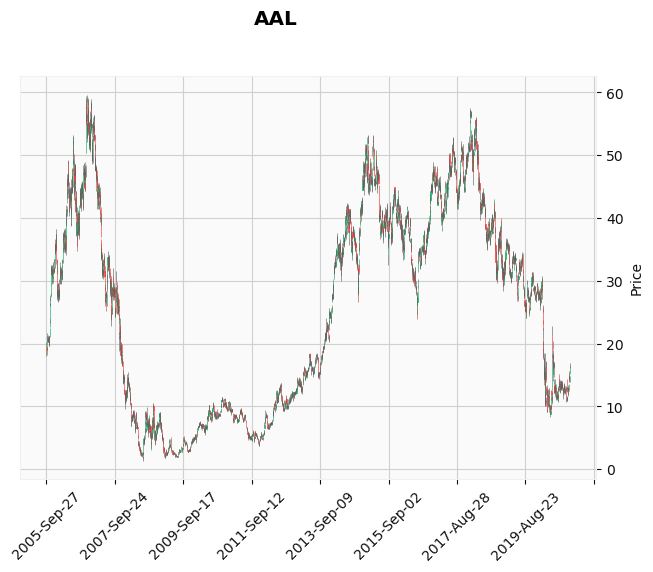

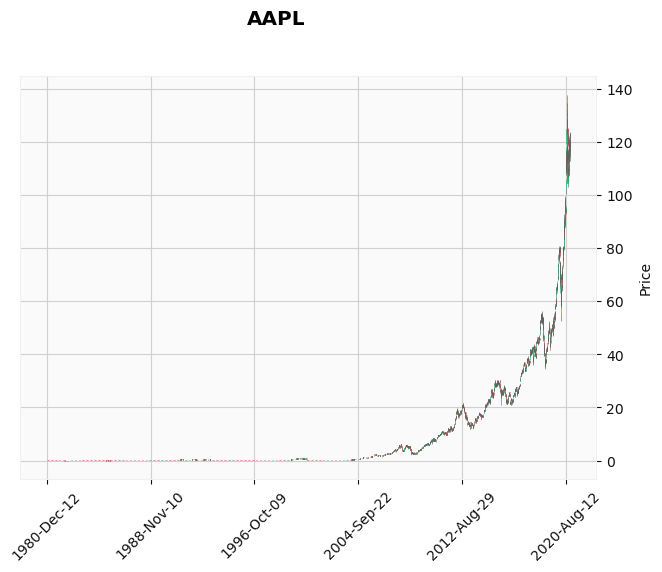

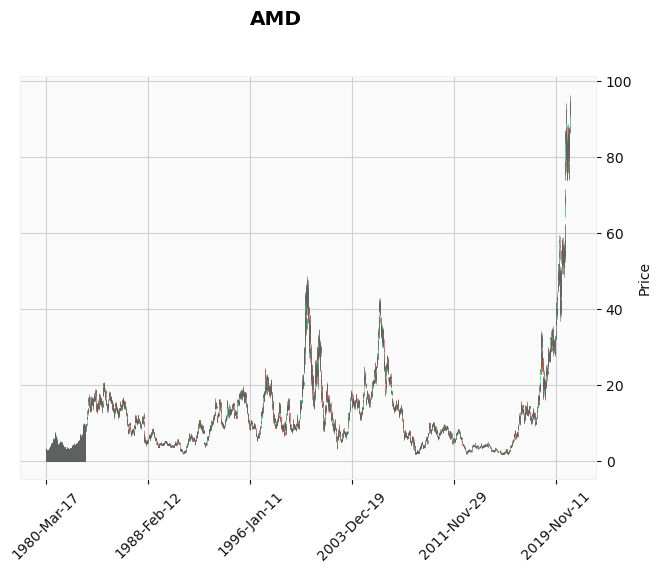

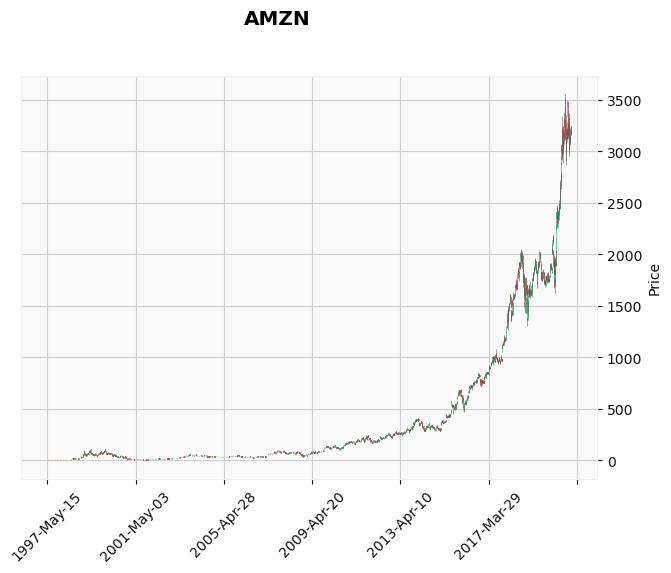

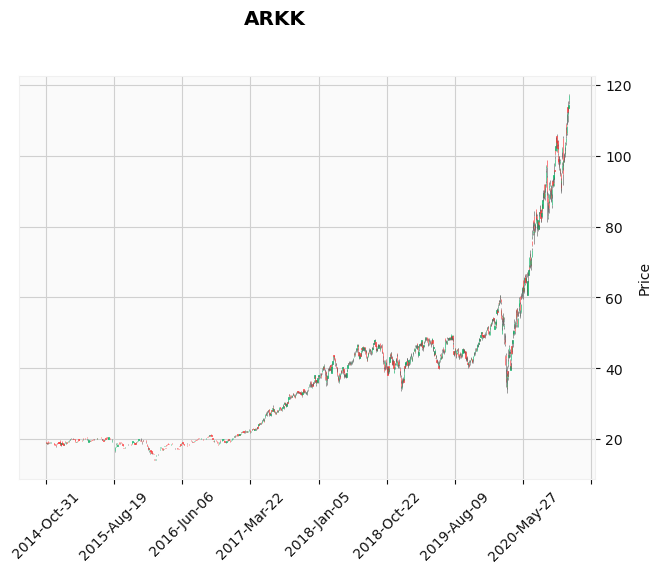

<IPython.core.display.Javascript object>

In [10]:
for s in symbols[:5]:
    mpf.plot(
        data[s],
        type="candle",
        style="yahoo",
        # addplot=apd,
        title=f"{s}",  # savefig=savefig_kwds,
    )

# Count the quantity of consecutive up and down days

In [11]:
def get_streaks(y):
    # REF: https://stackoverflow.com/questions/27626542/counting-consecutive-positive-value-in-python-array
    return y * (y.groupby((y != y.shift()).cumsum()).cumcount() + 1)


def get_streak_data(indf, symbol, column):
    r = indf[symbol].pct_change().dropna()
    signs = np.sign(r)
    streaks = get_streaks(signs[column]).rename(symbol)
    return streaks

<IPython.core.display.Javascript object>

In [12]:
sns.set_theme(
    context="paper",
    style="darkgrid",
    palette=sns.color_palette("bright", n_colors=len(files)),
    rc=sns_params,
    color_codes=True,
)

<IPython.core.display.Javascript object>

<AxesSubplot:title={'center':'Streak Counts Timeseries'}, xlabel='Date'>

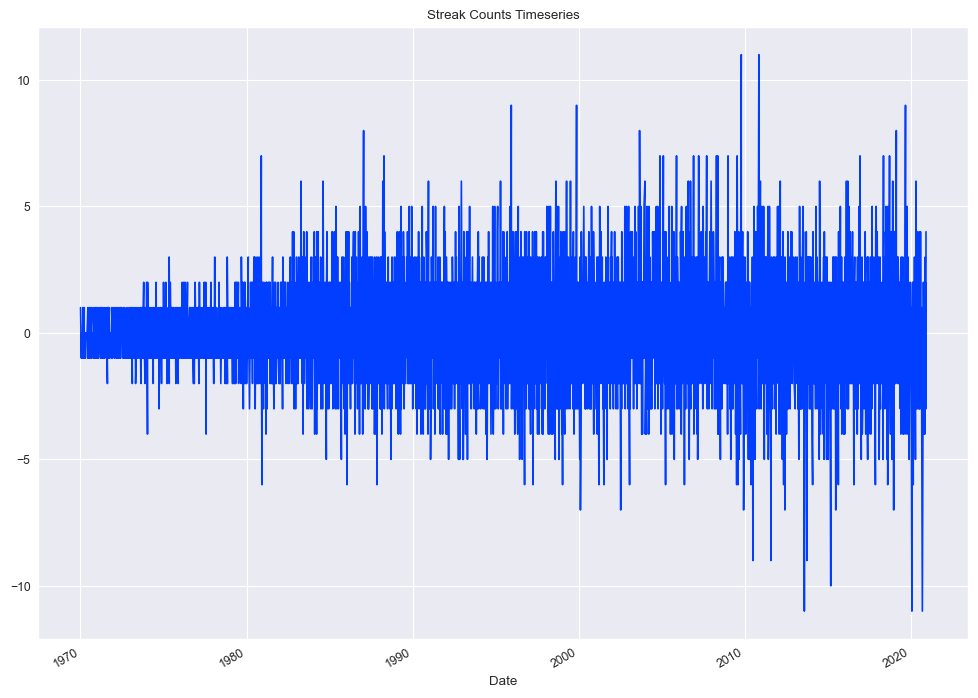

<IPython.core.display.Javascript object>

In [13]:
s = get_streak_data(data, symbol, "Close")
s.plot(figsize=(12, 9), title="Streak Counts Timeseries")

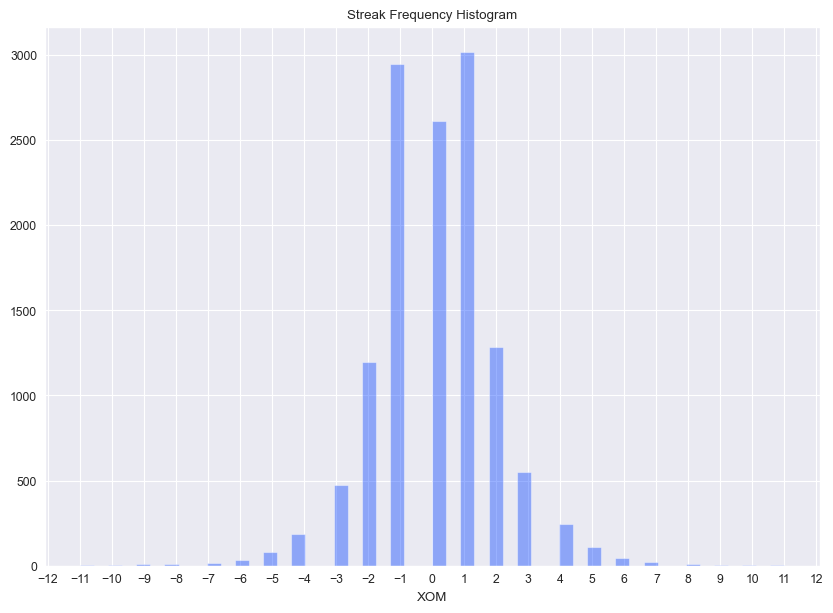

<IPython.core.display.Javascript object>

In [21]:
fig, ax = plt.subplots(figsize=(10, 7))
sns.distplot(s, kde=False, ax=ax)
_ = ax.xaxis.set_major_locator(mpl.ticker.MaxNLocator(25))
_ = ax.set_title("Streak Frequency Histogram")

## Get streaks for all symbols

In [18]:
streaks = []
streak_ts = []

for symbol in tqdm(symbols):
    tmp_s = get_streak_data(data, symbol, "Close")
    streak_ts.append(tmp_s)
    streaks.append(tmp_s.value_counts())

100%|█████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 131.71it/s]


<IPython.core.display.Javascript object>

In [19]:
counts = pd.concat(streaks, axis=1).fillna(0)
cprint(counts)

-------------------------------------------------------------------------------
dataframe information
-------------------------------------------------------------------------------
HEAD num rows: 5
       AAL  AAPL  AMD  AMZN  ARKK  BYND  CCL  DAL  DDOG  FDX  FSLY  GOOGL  \
-15.0  0.0   0.0  0.0   0.0   0.0   0.0  0.0  0.0   0.0  0.0   0.0    0.0   
-14.0  0.0   0.0  0.0   0.0   0.0   0.0  0.0  0.0   0.0  0.0   0.0    0.0   
-13.0  0.0   0.0  0.0   0.0   0.0   0.0  0.0  0.0   0.0  1.0   0.0    1.0   
-12.0  0.0   0.0  0.0   0.0   0.0   0.0  1.0  0.0   0.0  1.0   0.0    1.0   
-11.0  1.0   0.0  0.0   0.0   0.0   0.0  2.0  0.0   0.0  1.0   0.0    1.0   

       IBB  IYR  LUV  MSFT  NFLX  NIO  NKE  NVDA  PYPL  RKT  ROKU  SHOP  SMH  \
-15.0  0.0  0.0  0.0   0.0   0.0  0.0  0.0   0.0   0.0  0.0   0.0   0.0  0.0   
-14.0  0.0  0.0  0.0   0.0   0.0  0.0  0.0   0.0   0.0  0.0   0.0   0.0  0.0   
-13.0  0.0  0.0  0.0   0.0   0.0  0.0  0.0   0.0   0.0  0.0   0.0   0.0  0.0   
-12.0  0.0  0.0  0

<IPython.core.display.Javascript object>

<AxesSubplot:>

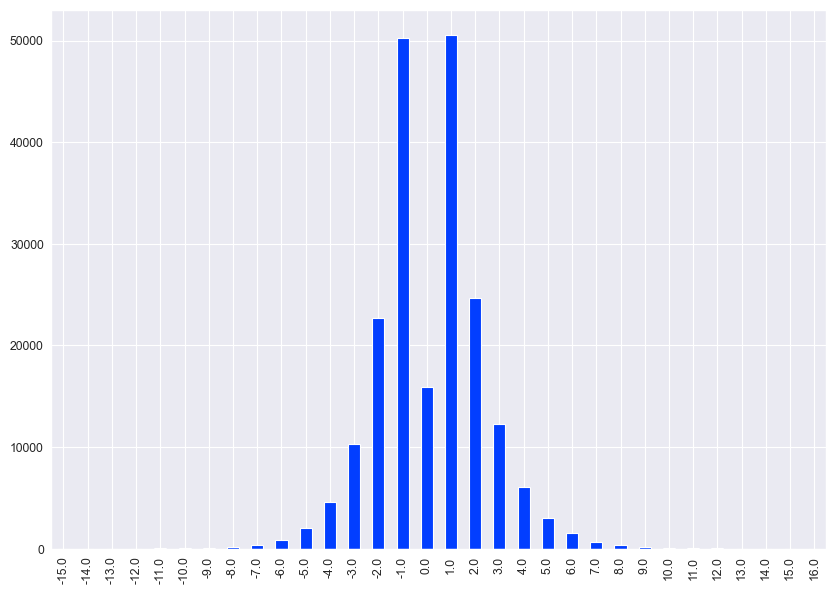

<IPython.core.display.Javascript object>

In [22]:
counts.sum(1).plot.bar()

Text(0.5, 1.0, 'Count Frequency as Percentage of Total')

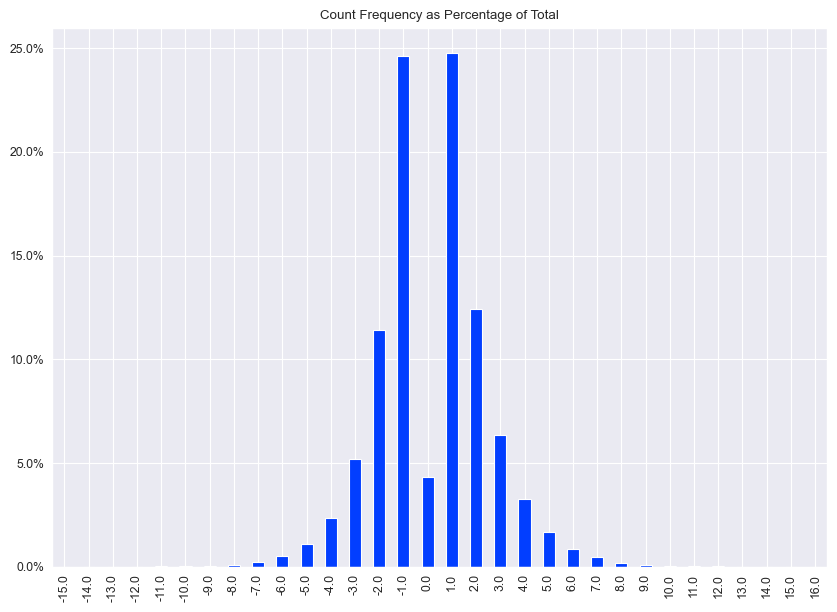

<IPython.core.display.Javascript object>

In [26]:
ax = (counts / counts.sum()).mean(1).plot.bar()
_ = ax.yaxis.set_major_formatter(mpl.ticker.PercentFormatter(1))
ax.set_title("Count Frequency as Percentage of Total")

<AxesSubplot:>

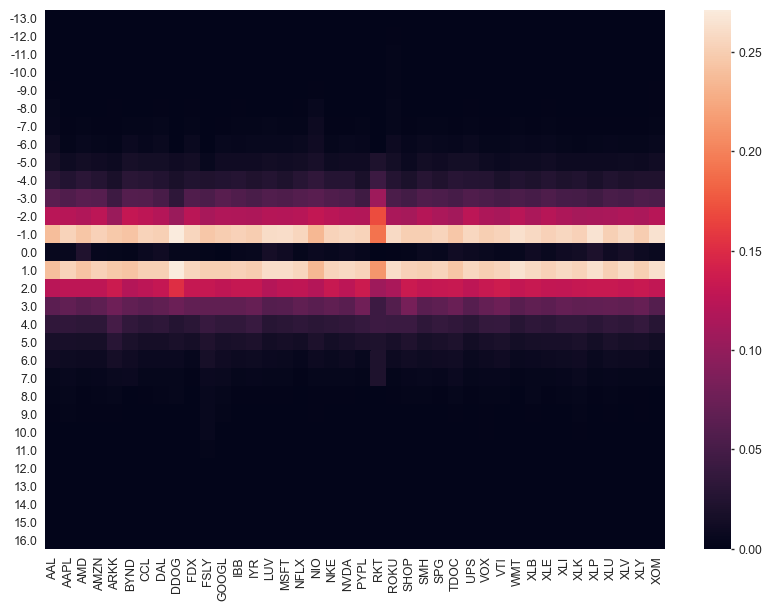

<IPython.core.display.Javascript object>

In [30]:
sns.heatmap(counts / counts.sum())  # .mean(1)

## Get the mean percentage of streaks 

split by up and down days

In [27]:
avg_pct_down_days = (
    counts[counts.index < 0].cumsum().mean(1)
    / counts[counts.index < 0].cumsum().mean(1).sum()
)
avg_pct_down_days

-15.0    0.000006
-14.0    0.000012
-13.0    0.000030
-12.0    0.000066
-11.0    0.000175
-10.0    0.000326
-9.0     0.000719
-8.0     0.001681
-7.0     0.003966
-6.0     0.009346
-5.0     0.021758
-4.0     0.049307
-3.0     0.111460
-2.0     0.248740
-1.0     0.552408
dtype: float64

<IPython.core.display.Javascript object>

In [28]:
avg_pct_up_days = (
    counts[counts.index > 0][::-1].cumsum().mean(1)
    / counts[counts.index > 0][::-1].cumsum().mean(1).sum()
)
avg_pct_up_days

16.0    0.000005
15.0    0.000026
14.0    0.000046
13.0    0.000087
12.0    0.000174
11.0    0.000358
10.0    0.000772
9.0     0.001615
8.0     0.003393
7.0     0.006944
6.0     0.014561
5.0     0.029874
4.0     0.061010
3.0     0.123711
2.0     0.249655
1.0     0.507771
dtype: float64

<IPython.core.display.Javascript object>

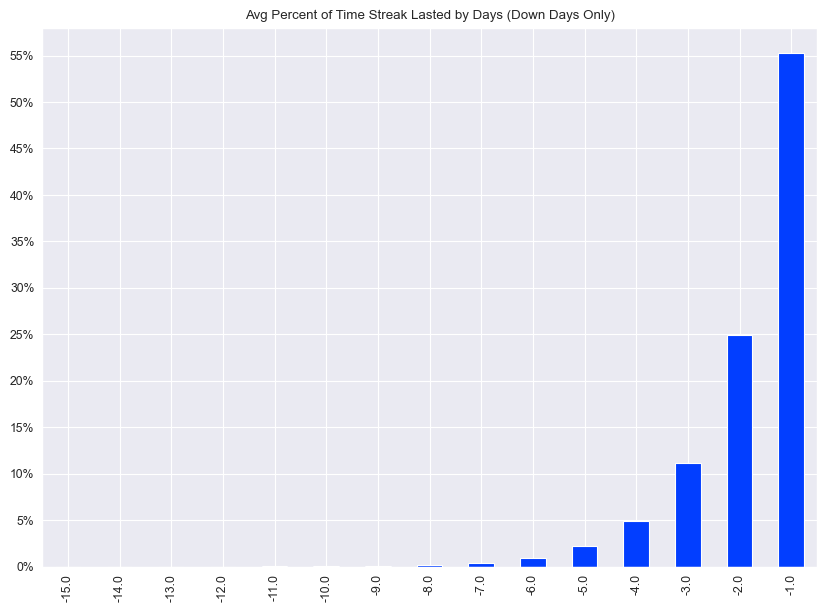

<IPython.core.display.Javascript object>

In [29]:
ax = avg_pct_down_days.plot.bar(
    title="Avg Percent of Time Streak Lasted by Days (Down Days Only)"
)
ax.yaxis.set_major_formatter(mpl.ticker.PercentFormatter(1))
ax.yaxis.set_major_locator(mpl.ticker.MaxNLocator(12))

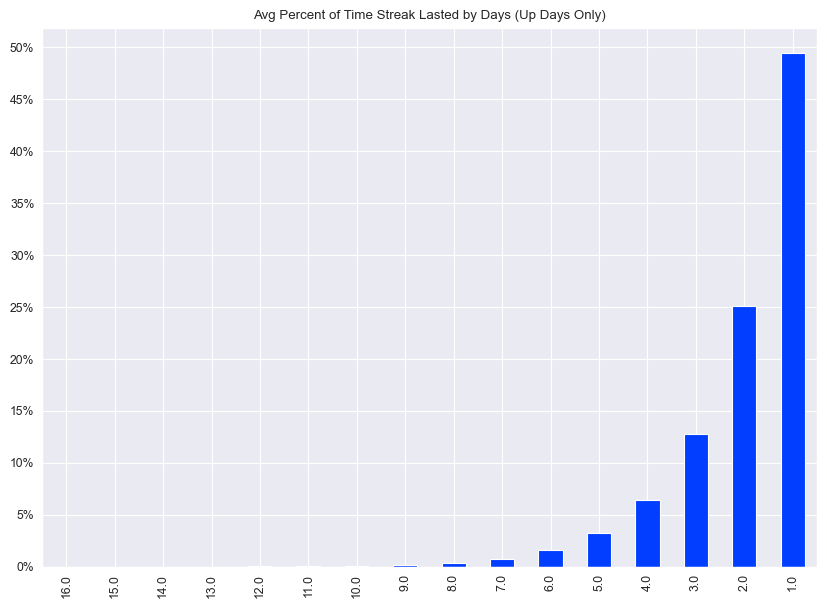

<IPython.core.display.Javascript object>

In [41]:
ax = avg_pct_up_days.plot.bar(
    title="Avg Percent of Time Streak Lasted by Days (Up Days Only)"
)
ax.yaxis.set_major_formatter(mpl.ticker.PercentFormatter(1))
ax.yaxis.set_major_locator(mpl.ticker.MaxNLocator(12))

# Daily Data Event Study

get timestamps of trigger date. and record the following t+30

In [30]:
sdf = pd.concat(streak_ts, axis=1)
cprint(sdf)

-------------------------------------------------------------------------------
dataframe information
-------------------------------------------------------------------------------
HEAD num rows: 5
            AAL  AAPL  AMD  AMZN  ARKK  BYND  CCL  DAL  DDOG  FDX  FSLY  \
Date                                                                      
1970-01-02  NaN   NaN  NaN   NaN   NaN   NaN  NaN  NaN   NaN  NaN   NaN   
1970-01-05  NaN   NaN  NaN   NaN   NaN   NaN  NaN  NaN   NaN  NaN   NaN   
1970-01-06  NaN   NaN  NaN   NaN   NaN   NaN  NaN  NaN   NaN  NaN   NaN   
1970-01-07  NaN   NaN  NaN   NaN   NaN   NaN  NaN  NaN   NaN  NaN   NaN   
1970-01-08  NaN   NaN  NaN   NaN   NaN   NaN  NaN  NaN   NaN  NaN   NaN   

            GOOGL  IBB  IYR  LUV  MSFT  NFLX  NIO  NKE  NVDA  PYPL  RKT  ROKU  \
Date                                                                            
1970-01-02    NaN  NaN  NaN  NaN   NaN   NaN  NaN  NaN   NaN   NaN  NaN   NaN   
1970-01-05    NaN  NaN  NaN  NaN

<IPython.core.display.Javascript object>

## Choose streak number to analyze

In [31]:
streak_number = 5

<IPython.core.display.Javascript object>

One thing to mention is that the streaks are based on close to close returns, so there could have been days that closed lower in a single day (red day) but was still considered a gain based on the closes. 

In [32]:
long_streak_num = -streak_number  # after 5 down days go long
short_streak_num = streak_number  # after 5 up days go short

long_timestamps = {}
short_timestamps = {}

for sym in tqdm(sdf.columns):
    long_dts = sdf[sym][sdf[sym] == long_streak_num].index.tz_localize(None)  # .date
    short_dts = sdf[sym][sdf[sym] == short_streak_num].index.tz_localize(None)  # .date

    long_timestamps[sym] = long_dts
    short_timestamps[sym] = short_dts

100%|████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 1321.51it/s]


<IPython.core.display.Javascript object>

### get the +/- n days of event

In [36]:
n_days_before = 30
n_days_after = 30

freq = 1
freq_type = "D"

levents = {}
sevents = {}

for sym in tqdm(symbols, desc="main loop"):
    levents[sym] = []
    sevents[sym] = []

    tmp_df = data[sym]
    tmp_lts = long_timestamps[sym]
    tmp_sts = short_timestamps[sym]

    for lts in tqdm(tmp_lts, desc=f"long timestamps {sym}"):

        data_range_l = tmp_df.loc[
            lts
            - (n_days_before * pd.Timedelta(f"{freq}{freq_type}")) : lts
            + (n_days_after * pd.Timedelta(f"{freq}{freq_type}"))
        ]
        data_range_l["is_trigger_date"] = False
        data_range_l.loc[lts, "is_trigger_date"] = True

        levents[sym].append(data_range_l)

    for sts in tqdm(tmp_sts, desc=f"short timestamps {sym}"):

        data_range_s = tmp_df.loc[
            sts
            - (n_days_before * pd.Timedelta(f"{freq}{freq_type}")) : sts
            + (n_days_after * pd.Timedelta(f"{freq}{freq_type}"))
        ]
        data_range_s["is_trigger_date"] = False
        data_range_s.loc[sts, "is_trigger_date"] = True
        sevents[sym].append(data_range_s)

long timestamps AAL: 100%|████████████████████████████████████████████████████████████| 63/63 [00:00<00:00, 761.08it/s]

long timestamps AAPL: 100%|███████████████████████████████████████████████████████████| 37/37 [00:00<00:00, 633.53it/s]

long timestamps AMD: 100%|██████████████████████████████████████████████████████████| 115/115 [00:00<00:00, 633.63it/s]

long timestamps AMZN: 100%|███████████████████████████████████████████████████████████| 67/67 [00:00<00:00, 589.07it/s]

long timestamps ARKK: 100%|███████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 578.79it/s]

long timestamps BYND: 100%|█████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 501.41it/s]

short timestamps BYND: 100%|████████████████████████████████████████████████████████████| 7/7 [00:00<00:00, 619.41it/s]

long timestamps CCL: 100%|██████████████████████████████████████████████████████████| 103/103 [00:00<00:00, 558.17it/s]

long timestamps DAL: 100%|██████

long timestamps NFLX: 100%|███████████████████████████████████████████████████████████| 59/59 [00:00<00:00, 664.39it/s]

long timestamps NIO: 100%|██████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 751.94it/s]

short timestamps NIO: 100%|███████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 525.21it/s]

long timestamps NKE: 100%|████████████████████████████████████████████████████████████| 51/51 [00:00<00:00, 631.31it/s]

long timestamps NVDA: 100%|███████████████████████████████████████████████████████████| 61/61 [00:00<00:00, 623.85it/s]

long timestamps PYPL: 100%|███████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 456.59it/s]

short timestamps PYPL: 100%|██████████████████████████████████████████████████████████| 29/29 [00:00<00:00, 505.66it/s]

long timestamps RKT: 100%|██████████████████████████████████████████████████████████████| 2/2 [00:00<00:00, 401.02it/s]

long timestamps ROKU: 100%|█████

long timestamps XLP: 100%|████████████████████████████████████████████████████████████| 45/45 [00:00<00:00, 537.15it/s]

long timestamps XLU: 100%|████████████████████████████████████████████████████████████| 46/46 [00:00<00:00, 632.77it/s]

long timestamps XLV: 100%|████████████████████████████████████████████████████████████| 55/55 [00:00<00:00, 647.68it/s]

long timestamps XLY: 100%|████████████████████████████████████████████████████████████| 52/52 [00:00<00:00, 592.78it/s]

long timestamps XOM: 100%|████████████████████████████████████████████████████████████| 83/83 [00:00<00:00, 519.94it/s]

main loop: 100%|███████████████████████████████████████████████████████████████████████| 40/40 [00:08<00:00,  4.50it/s]


<IPython.core.display.Javascript object>

### plot some events to see what they look like

In [43]:
def get_signal(indata, offset=0.99):
    signal = indata["is_trigger_date"].copy()
    signal.loc[signal == True] = indata.query("is_trigger_date == True").Low * offset
    signal.loc[signal == False] = np.nan
    return signal


def plot_event_prices(indata, symbol, offset, event_type="long"):
    signal = get_signal(indata, offset=offset)
    apd = mpf.make_addplot(signal, type="scatter", markersize=120, marker="^")
    # savefig_kwds[
    #    "fname"
    # ] = f"{symbol} 5Min {igb[0].name.strftime('%Y-%m-%d %H:%M:%S')} - {rsb[-1].name.strftime('%Y-%m-%d %H:%M:%S')}.png"
    trigger_date = (
        indata.query("is_trigger_date == True").index[0].date().strftime("%Y-%m-%d")
    )
    mpf.plot(
        indata,
        type="candle",
        style="yahoo",
        addplot=apd,
        title=f"{symbol} | event_type: {event_type} | trigger date: {trigger_date}",
        # savefig=savefig_kwds,
    )
    return

<IPython.core.display.Javascript object>

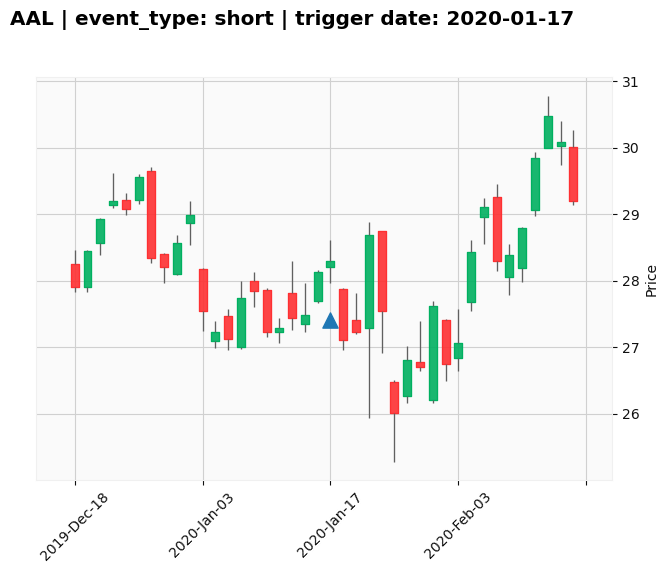

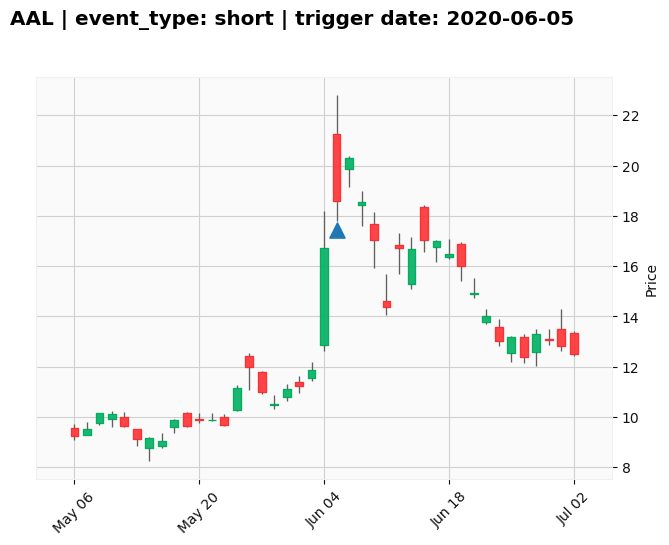

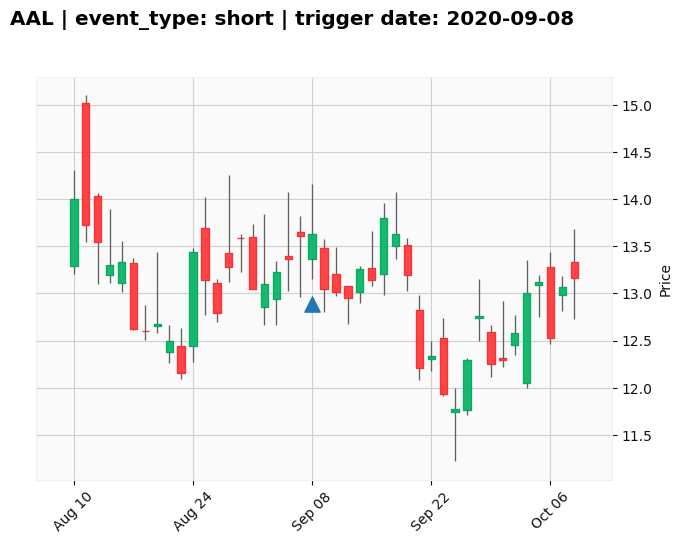

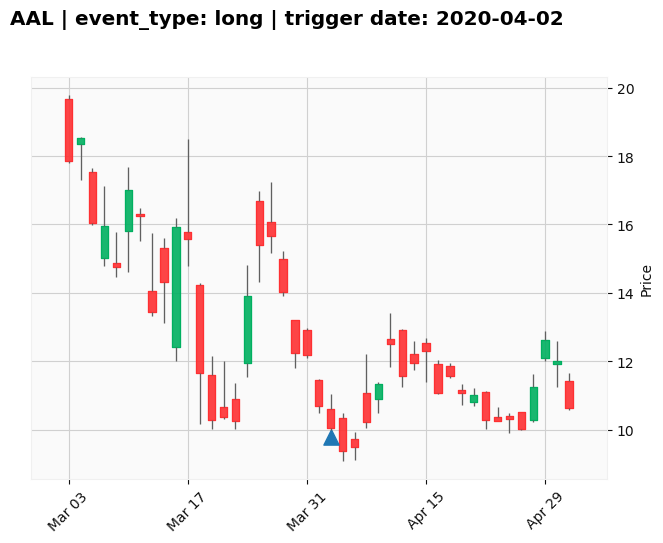

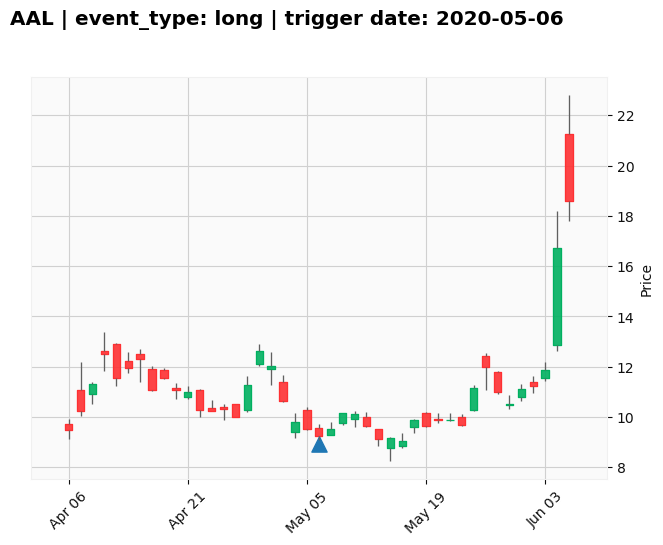

...

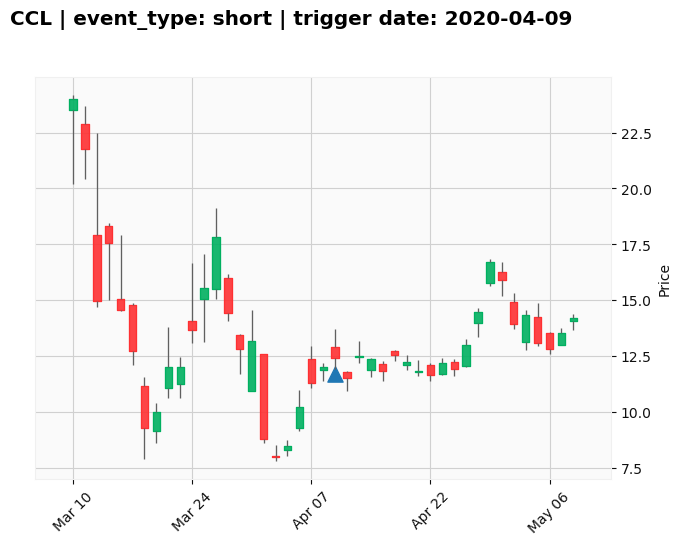

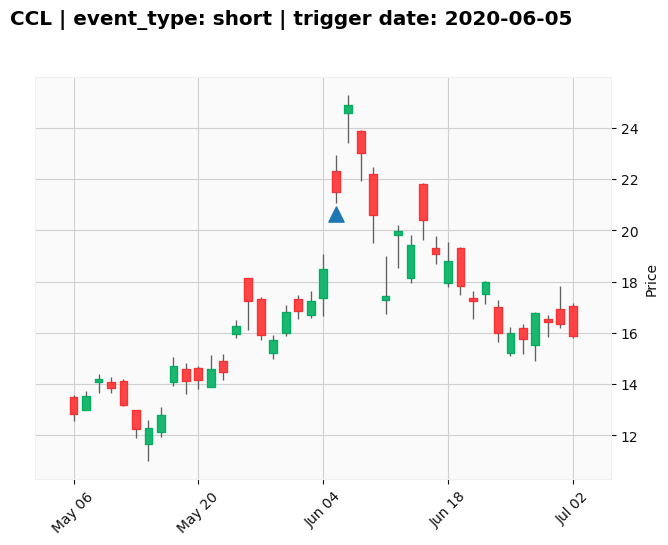

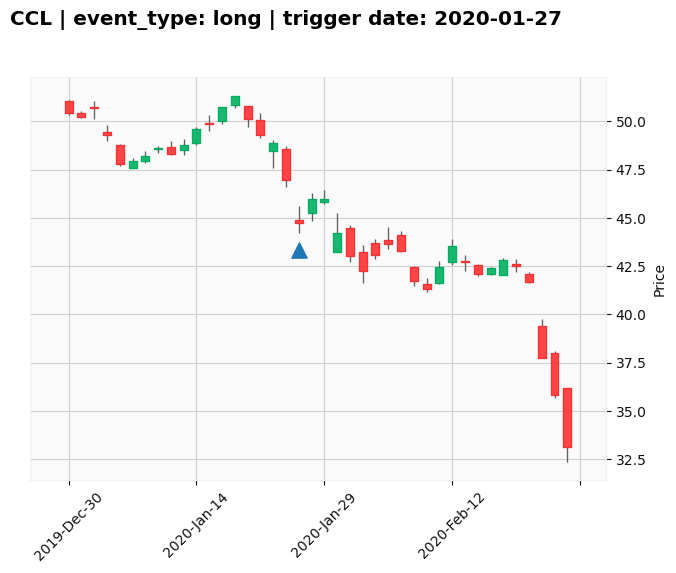

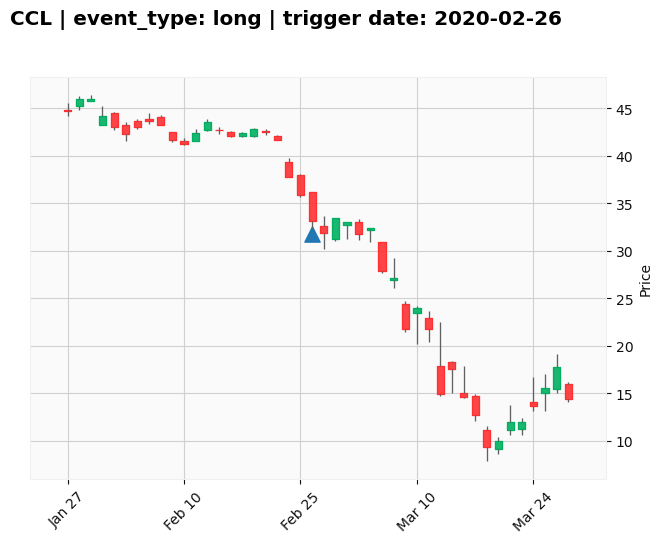

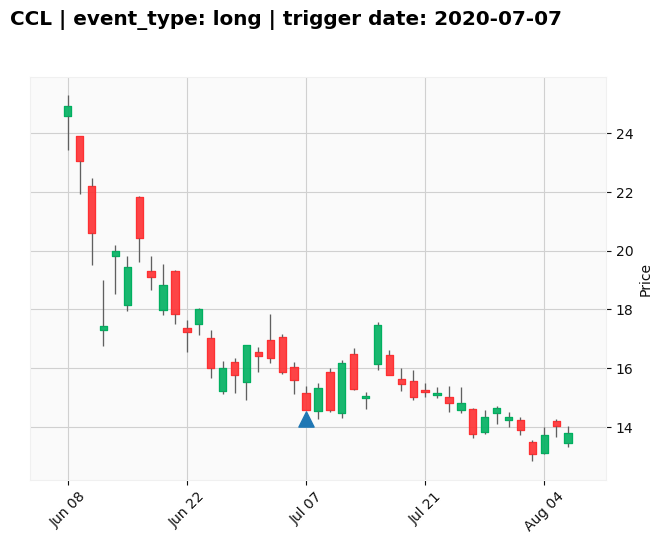

<IPython.core.display.Javascript object>

In [45]:
np.random.seed(0)
syms = np.random.choice(symbols, 10)
for sym in syms:
    stmp = sevents[sym]
    for d in stmp[-3:]:
        plot_event_prices(d, sym, offset=0.98, event_type="short")

    ltmp = levents[sym]
    for d in ltmp[-3:]:
        plot_event_prices(d, sym, offset=0.98, event_type="long")

### Get the returns post events and analyze

Short Events

In [46]:
def get_post_event_returns(events, symbols):
    events_returns = []
    for symbol in tqdm(symbols):
        for event in events[symbol]:
            trigger_date = event.query("is_trigger_date == True").index[0].date()
            clcl = (
                np.log(event.loc[trigger_date:].Close)
                .diff()
                .fillna(0)
                .rename(f"{symbol}_{trigger_date}")
                .reset_index(drop=True)
            )
            events_returns.append(clcl)
    return pd.concat(events_returns, axis=1)

<IPython.core.display.Javascript object>

In [47]:
sr = get_post_event_returns(sevents, symbols)

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:07<00:00,  5.29it/s]


<IPython.core.display.Javascript object>

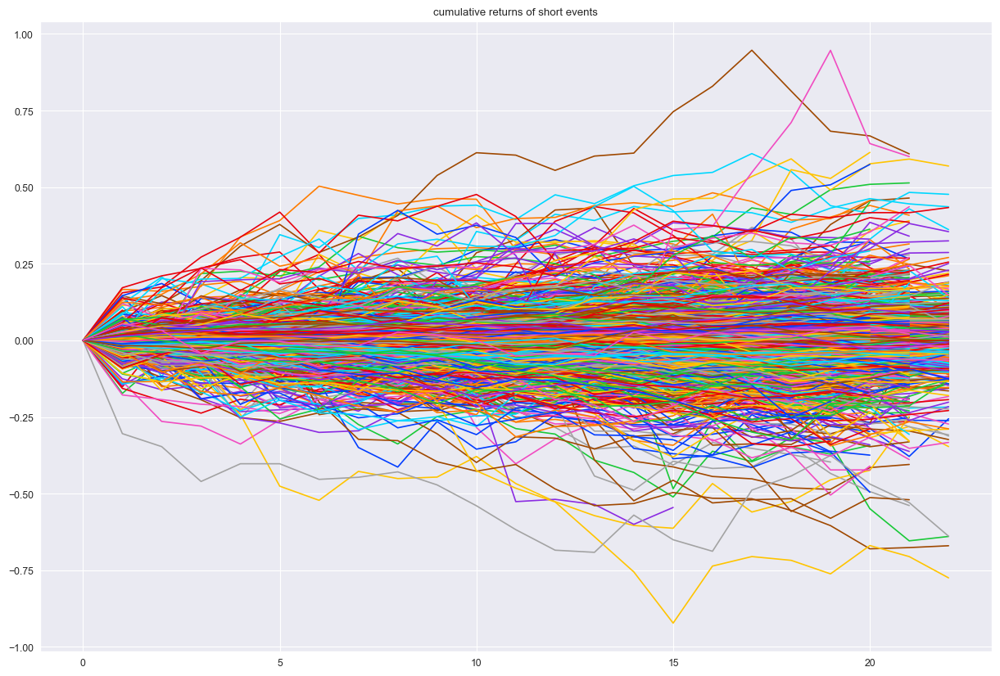

<IPython.core.display.Javascript object>

In [48]:
sns.set_theme(
    context="paper",
    style="darkgrid",
    palette=sns.color_palette("bright", n_colors=len(files)),
    rc=sns_params,
    color_codes=True,
)
_ = sr.cumsum().plot(
    legend=False, figsize=(15, 10), title="cumulative returns of short events"
)

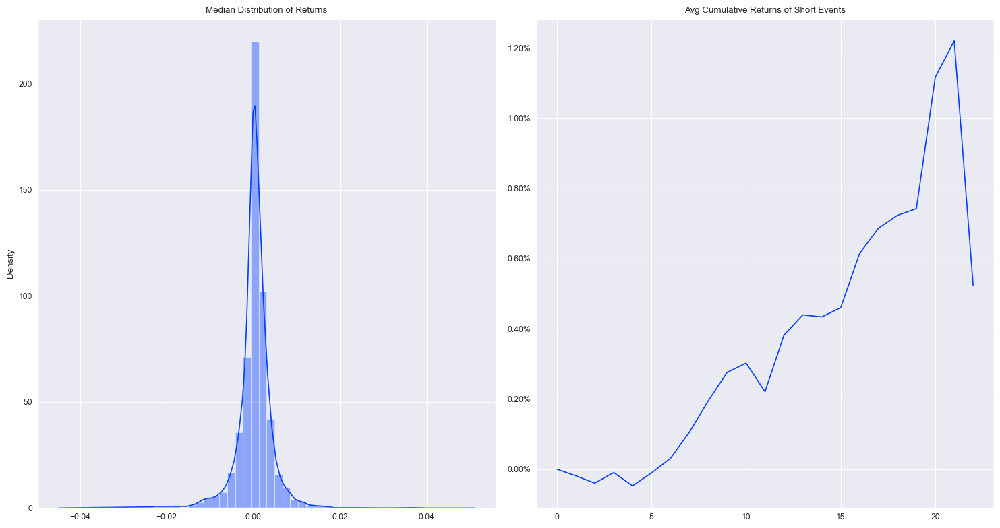

<IPython.core.display.Javascript object>

In [49]:
fig, ax = plt.subplots(1, 2, figsize=(15, 8))
sns.distplot(sr.median(), ax=ax[0])
ax[0].set_title("Median Distribution of Returns")
_ = sr.cumsum().mean(1).plot(ax=ax[1], title="Avg Cumulative Returns of Short Events")
ax[1].yaxis.set_major_formatter(mpl.ticker.PercentFormatter(1))
plt.tight_layout()

long events

In [50]:
lr = get_post_event_returns(levents, symbols)

100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  8.06it/s]


<IPython.core.display.Javascript object>

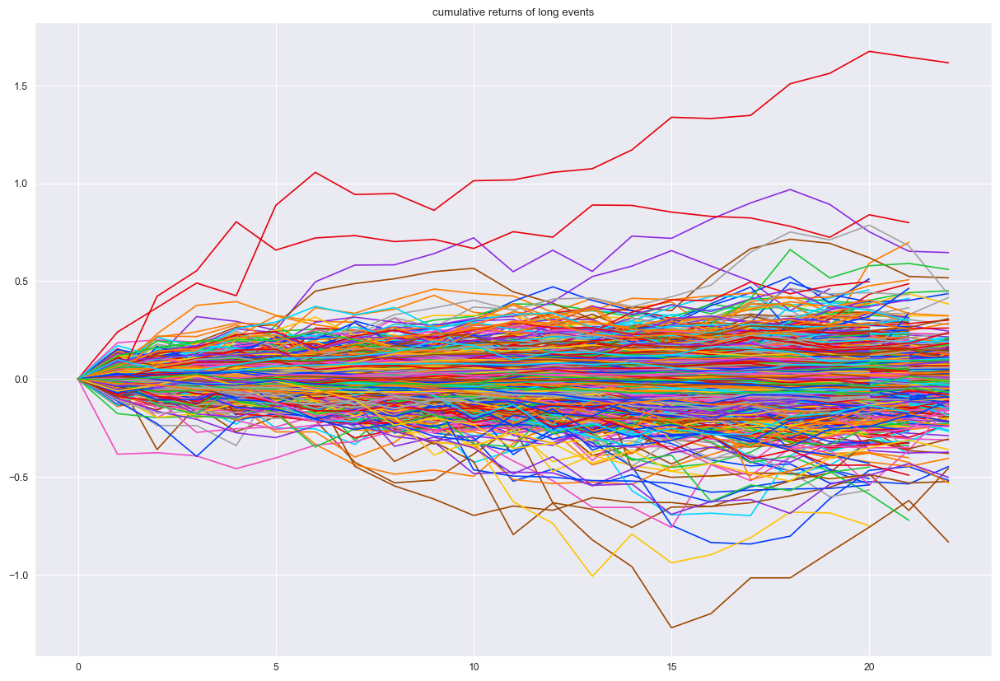

<IPython.core.display.Javascript object>

In [51]:
_ = lr.cumsum().plot(
    legend=False, figsize=(15, 10), title="cumulative returns of long events"
)

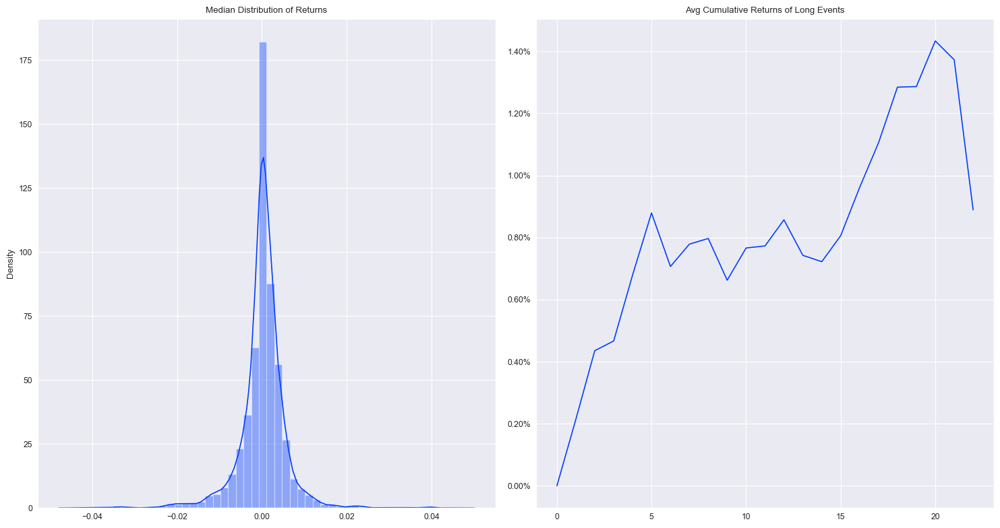

<IPython.core.display.Javascript object>

In [52]:
fig, ax = plt.subplots(1, 2, figsize=(15, 8))
sns.distplot(lr.median(), ax=ax[0])
ax[0].set_title("Median Distribution of Returns")
_ = lr.cumsum().mean(1).plot(ax=ax[1], title="Avg Cumulative Returns of Long Events")
ax[1].yaxis.set_major_formatter(mpl.ticker.PercentFormatter(1))
plt.tight_layout()

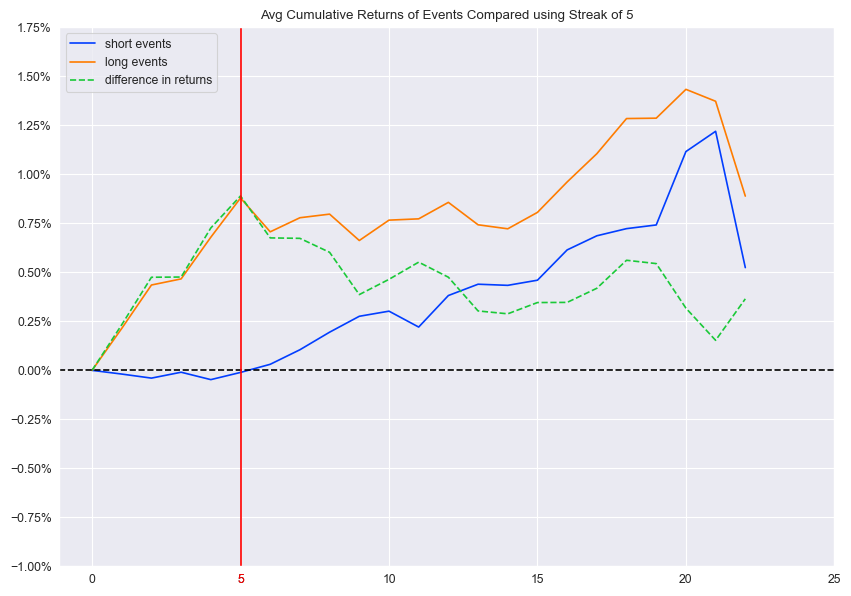

<IPython.core.display.Javascript object>

In [56]:
fig, ax = plt.subplots(figsize=(10, 7))
_ = (
    sr.cumsum()
    .mean(1)
    .plot(
        title=f"Avg Cumulative Returns of Events Compared using Streak of {streak_number}",
        label="short events",
        legend=True,
        ax=ax,
    )
)
_ = lr.cumsum().mean(1).plot(label="long events", legend=True, ax=ax)
diff = lr.cumsum().mean(1) - sr.cumsum().mean(1)
_ = diff.plot(label="difference in returns", legend=True, ax=ax, ls="--")
_ = ax.set_yticks(np.arange(-0.01, 0.02, 0.0025))
ax.yaxis.set_major_formatter(mpl.ticker.PercentFormatter(1))
ax.axhline(0, color="k", ls="--")
ax.axvline(diff.idxmax(), color="r")
ax.set_xticks(list(plt.xticks()[0])[1:] + [diff.idxmax()])
list(ax.get_xticklabels())[-1].set_color("r")

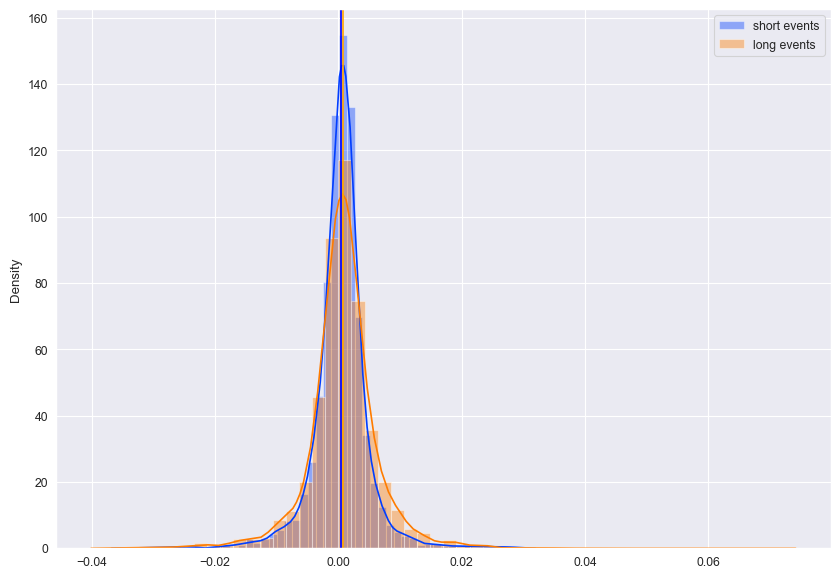

<IPython.core.display.Javascript object>

In [57]:
fig, ax = plt.subplots(figsize=(10, 7))
_ = sns.distplot(sr.mean(), ax=ax, label="short events")
_ = sns.distplot(lr.mean(), ax=ax, label="long events")
ax.axvline(sr.mean().mean(), color="b")
ax.axvline(lr.mean().mean(), color="orange")
_ = ax.legend()

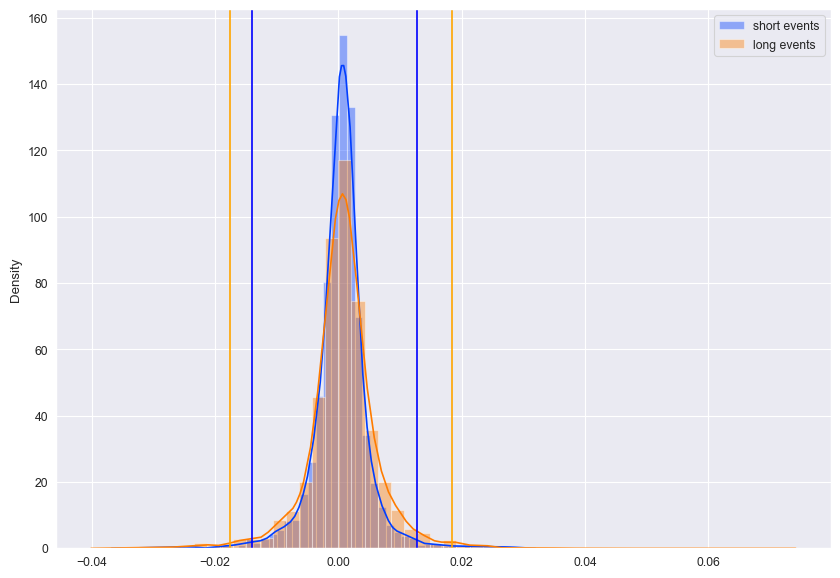

<IPython.core.display.Javascript object>

In [58]:
fig, ax = plt.subplots(figsize=(10, 7))
_ = sns.distplot(sr.mean(), ax=ax, label="short events")
_ = sns.distplot(lr.mean(), ax=ax, label="long events")
ax.axvline(sr.mean().quantile(0.01), color="blue")
ax.axvline(lr.mean().quantile(0.01), color="orange")
ax.axvline(sr.mean().quantile(0.99), color="blue")
ax.axvline(lr.mean().quantile(0.99), color="orange")
_ = ax.legend()

In [60]:
def expand_to_multi(indf):
    out = indf.T.copy()  # assumes columns have the symbol date pair
    out[["symbol", "date"]] = out.index.to_series().str.split(pat="_", n=1, expand=True)
    out["date"] = pd.to_datetime(out["date"])
    out.set_index(["symbol", "date"], inplace=True)
    out.sort_index(inplace=True)
    return out


sr_t = expand_to_multi(sr)
cprint(sr_t)

lr_t = expand_to_multi(lr)
cprint(lr_t)

-------------------------------------------------------------------------------
dataframe information
-------------------------------------------------------------------------------
HEAD num rows: 5
                    0         1         2         3         4         5   \
symbol date                                                                
AAL    2005-10-06  0.0 -0.019446  0.002869 -0.010562 -0.010187 -0.001952   
       2005-11-01  0.0  0.096119  0.011486  0.032949  0.004410  0.017088   
       2005-12-20  0.0  0.033080  0.008678  0.024187 -0.007053 -0.000283   
       2006-03-20  0.0  0.000861  0.068457 -0.012399 -0.010360  0.011986   
       2006-05-05  0.0 -0.026993  0.087553 -0.030034 -0.019671 -0.022713   

                         6         7         8         9         10        11  \
symbol date                                                                     
AAL    2005-10-06  0.025086 -0.008132 -0.027266 -0.004948 -0.017009  0.043442   
       2005-11-01  0.0618

<IPython.core.display.Javascript object>

In [61]:
def agg_by_freq(indf, freq="W"):
    out = indf.reset_index(0, drop=True)
    out = pd.concat(
        [out.groupby(pd.Grouper(freq=freq))[col].mean() for col in out.columns], axis=1
    )
    out.dropna(how="all", inplace=True)
    # out = out.reset_index().melt(id_vars=["date"]).fillna(0.0)
    # out["date"] = out["date"].apply(lambda x: x.toordinal())
    return out


freq = "M"
sr_abd = agg_by_freq(sr_t, freq=freq)
cprint(sr_abd)

lr_abd = agg_by_freq(lr_t, freq=freq)
cprint(lr_abd)

-------------------------------------------------------------------------------
dataframe information
-------------------------------------------------------------------------------
HEAD num rows: 5
             0         1         2         3         4         5         6   \
date                                                                          
1978-08-31  0.0  0.026317 -0.006515 -0.006557  0.000000  0.006557  0.019418   
1978-09-30  0.0  0.027857 -0.016621 -0.011236  0.011236  0.011111  0.027250   
1978-12-31  0.0 -0.033902 -0.006920  0.027399 -0.020479 -0.006920  0.013793   
1979-03-31  0.0  0.000000 -0.013423  0.026668 -0.006601  0.026145 -0.012987   
1979-07-31  0.0 -0.022990 -0.015625  0.007843 -0.007843 -0.056695 -0.008368   

                  7         8         9         10        11        12  \
date                                                                     
1978-08-31  0.043894  0.036149 -0.017911 -0.068563  0.006431  0.050010   
1978-09-30 -0.010811  0.0

<IPython.core.display.Javascript object>

In [62]:
def format_data_for_trisurf(indf):
    out = indf.reset_index().melt(id_vars=["date"]).fillna(0.0)
    out["date"] = out["date"].apply(lambda x: x.toordinal())
    return out


abf_diff0 = lr_abd - sr_abd
abf_diff = format_data_for_trisurf(abf_diff0)
cprint(abf_diff)

-------------------------------------------------------------------------------
dataframe information
-------------------------------------------------------------------------------
HEAD num rows: 5
     date  variable  value
0  722235         0    0.0
1  722327         0    0.0
2  722357         0    0.0
3  722388         0    0.0
4  722449         0    0.0
-------------------------
TAIL num rows: 5
         date  variable     value
10759  737668        22  0.000000
10760  737698        22  0.029198
10761  737729        22  0.006524
10762  737759        22  0.000000
10763  737790        22  0.000000
--------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10764 entries, 0 to 10763
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   date      10764 non-null  int64  
 1   variable  10764 non-null  int64  
 2   value     10764 non-null  float64
dtypes: float64(1), int64(2)
memory us

<IPython.core.display.Javascript object>

In [63]:
abf_diff.iloc[100:].head()

,date,variable,value
100,726526,0,0.0
101,726557,0,0.0
102,726587,0,0.0
103,726618,0,0.0
104,726679,0,0.0


<IPython.core.display.Javascript object>

In [64]:
pos = abf_diff[abf_diff["value"] > 0]  # .iloc[-100:]
neg = abf_diff[abf_diff["value"] < 0]

<IPython.core.display.Javascript object>

In [65]:
import plotly.graph_objects as go


def plot_mesh(indf, zticks=0.25):
    fig = go.Figure(
        data=[
            go.Mesh3d(
                x=indf["date"].values,
                y=indf["variable"].values,
                z=indf["value"].values,
                colorscale="Magma",
                opacity=1,
                intensity=indf["value"].values,
                showscale=True,
            )
        ]
    )

    fig.update_layout(
        scene=dict(
            # xaxis = dict(nticks=4, range=[-100,100],),
            #             yaxis = dict(nticks=4, range=[-50,100],),
            zaxis=dict(
                nticks=25,
                range=[-zticks, zticks],
            ),
        ),
        width=700,
        margin=dict(r=20, l=10, b=10, t=10),
    )

    fig.show()

<IPython.core.display.Javascript object>

In [66]:
plot_mesh(pos[pos["value"] < pos["value"].quantile(1)])

<IPython.core.display.Javascript object>

In [68]:
plot_mesh(neg)

<IPython.core.display.Javascript object>

Truncate the values so that we get more clarity on the majority of returns from the strategy

In [70]:
plot_mesh(
    abf_diff[
        (abf_diff["value"].quantile(0.001) < abf_diff["value"])
        & (abf_diff["value"] < abf_diff["value"].quantile(0.999))
    ],
    zticks=0.1,
)

<IPython.core.display.Javascript object>

In [71]:
prob_gt_zero = round(abf_diff.query("value > 0").shape[0] / abf_diff.shape[0], 2)
prob_gt_zero

0.36

<IPython.core.display.Javascript object>

In [72]:
prob_lt_zero = round(abf_diff.query("value < 0").shape[0] / abf_diff.shape[0], 2)
prob_lt_zero

0.33

<IPython.core.display.Javascript object>

<AxesSubplot:xlabel='value', ylabel='Density'>

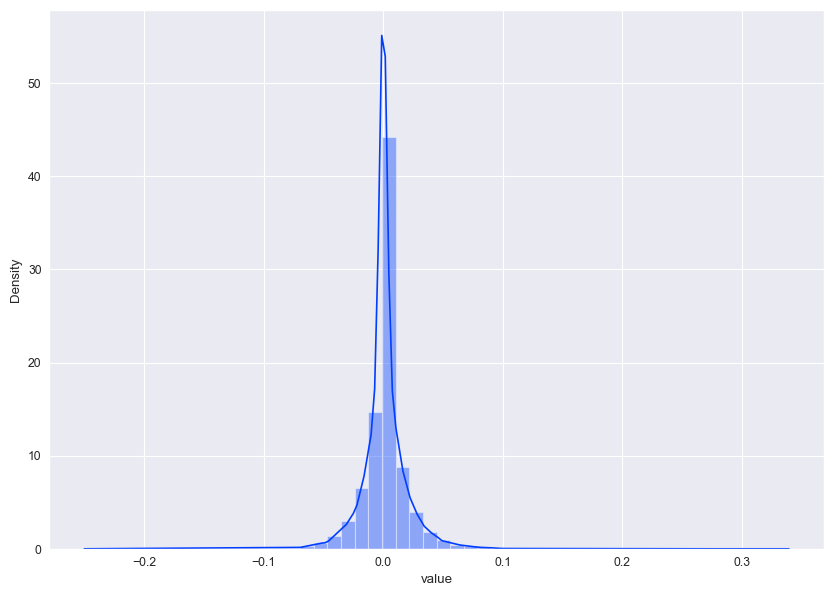

<IPython.core.display.Javascript object>

In [73]:
sns.distplot(abf_diff["value"])

In [74]:
avg_win = abf_diff.query("value > 0")["value"].mean()
avg_loss = abf_diff.query("value < 0")["value"].mean()

ex = ((avg_win * prob_gt_zero) + (avg_loss * prob_lt_zero)) * 100
ex

0.08349416597813333

<IPython.core.display.Javascript object>

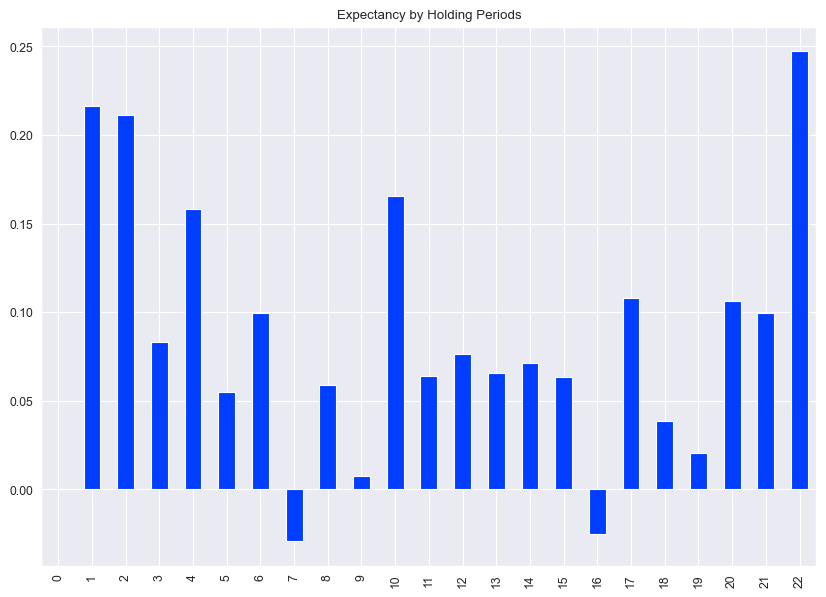

<IPython.core.display.Javascript object>

In [75]:
def expectancy_by_holding_period(indf, holding_period=1, mul=100):
    avg_win = indf.query("value > 0 and variable==@holding_period")["value"].mean()
    avg_loss = indf.query("value < 0 and variable==@holding_period")["value"].mean()

    ex = ((avg_win * prob_gt_zero) + (avg_loss * prob_lt_zero)) * mul
    return ex


exs = []
for hp in abf_diff["variable"].unique():
    tmp_ex = expectancy_by_holding_period(abf_diff, holding_period=hp, mul=100)
    exs.append(tmp_ex)

exps = pd.Series(exs, index=abf_diff.variable.unique())
_ = exps.plot.bar(title="Expectancy by Holding Periods")

In [76]:
mean_diff_dt = (
    lr_t.groupby(pd.Grouper(freq="A", level="date")).mean()
    - sr_t.groupby(pd.Grouper(freq="A", level="date")).mean()
)

<IPython.core.display.Javascript object>

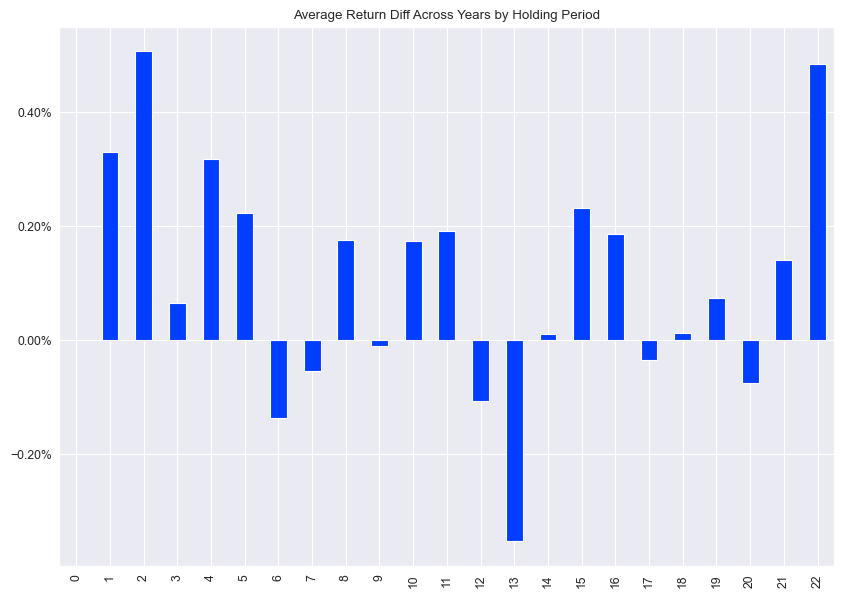

<IPython.core.display.Javascript object>

In [77]:
ax = (
    mean_diff_dt.mean()
    # .sort_values()[::-1]
    .plot.bar(title="Average Return Diff Across Years by Holding Period")
)
ax.yaxis.set_major_formatter(mpl.ticker.PercentFormatter(1))

In [78]:
mean_diff_symbol = (
    lr_t.groupby(pd.Grouper(level="symbol")).mean()
    - sr_t.groupby(pd.Grouper(level="symbol")).mean()
)

<IPython.core.display.Javascript object>

In [79]:
melt = pd.melt(mean_diff_symbol.reset_index(), id_vars=["symbol"])
melt

,symbol,variable,value
0,AAL,0,0.000000
1,AAPL,0,0.000000
2,AMD,0,0.000000
3,AMZN,0,0.000000
4,ARKK,0,0.000000
...,...,...,...
915,XLP,22,0.005330
916,XLU,22,0.002875
917,XLV,22,0.004318
918,XLY,22,0.006189


<IPython.core.display.Javascript object>

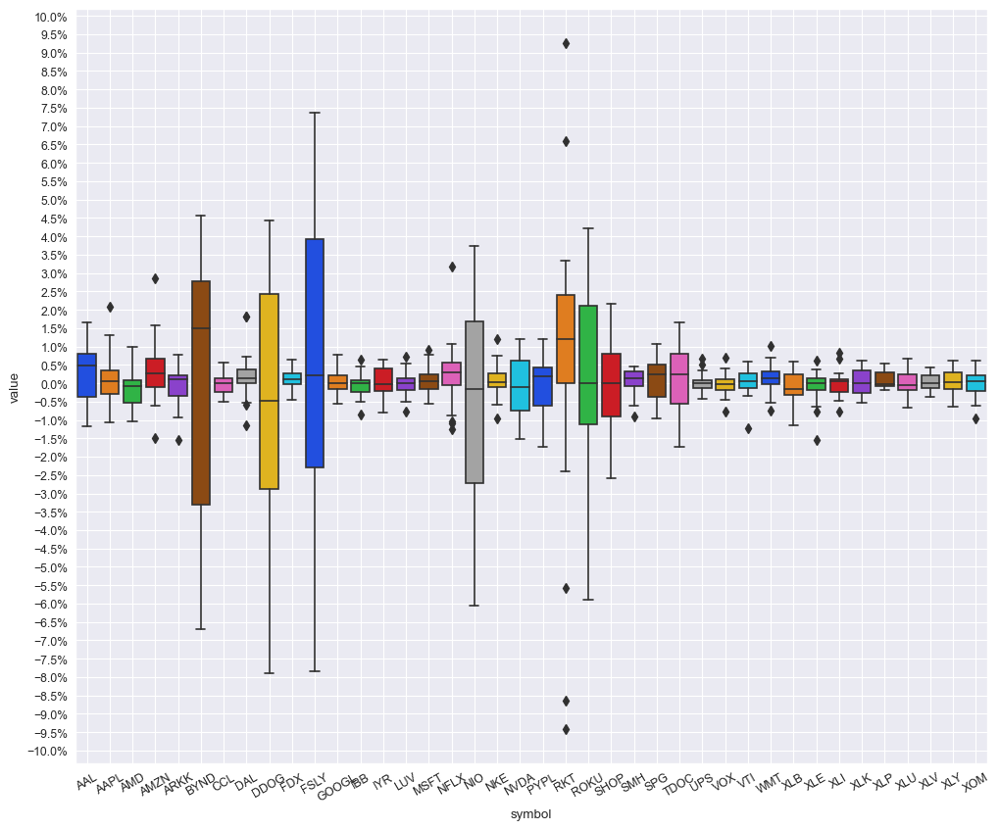

<IPython.core.display.Javascript object>

In [80]:
sns.set_theme(
    context="paper",
    style="darkgrid",
    palette=sns.color_palette("bright", n_colors=len(files)),
    rc=sns_params,
    color_codes=True,
)

plt.figure(figsize=(12, 10))
ax = sns.boxplot(data=melt, x="symbol", y="value")
_ = plt.xticks(rotation=30)
ax.yaxis.set_major_locator(plt.MaxNLocator(50))
ax.yaxis.set_major_formatter(mpl.ticker.PercentFormatter(1))
plt.grid(True)

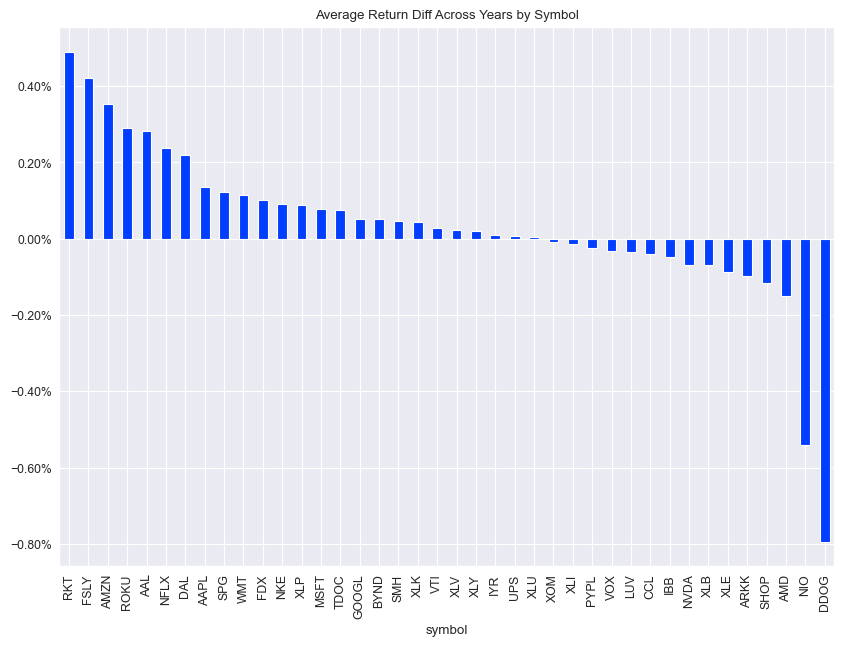

<IPython.core.display.Javascript object>

In [81]:
ax = (
    mean_diff_symbol.mean(1)
    .sort_values()[::-1]
    .plot.bar(title="Average Return Diff Across Years by Symbol")
)
ax.yaxis.set_major_formatter(mpl.ticker.PercentFormatter(1))